In [62]:
import numpy as np
from functools import reduce

from helper import index as helper
import matplotlib.pyplot as plt
from scipy.ndimage.filters import generic_filter as gf
from skimage.filters import gabor_kernel, gabor

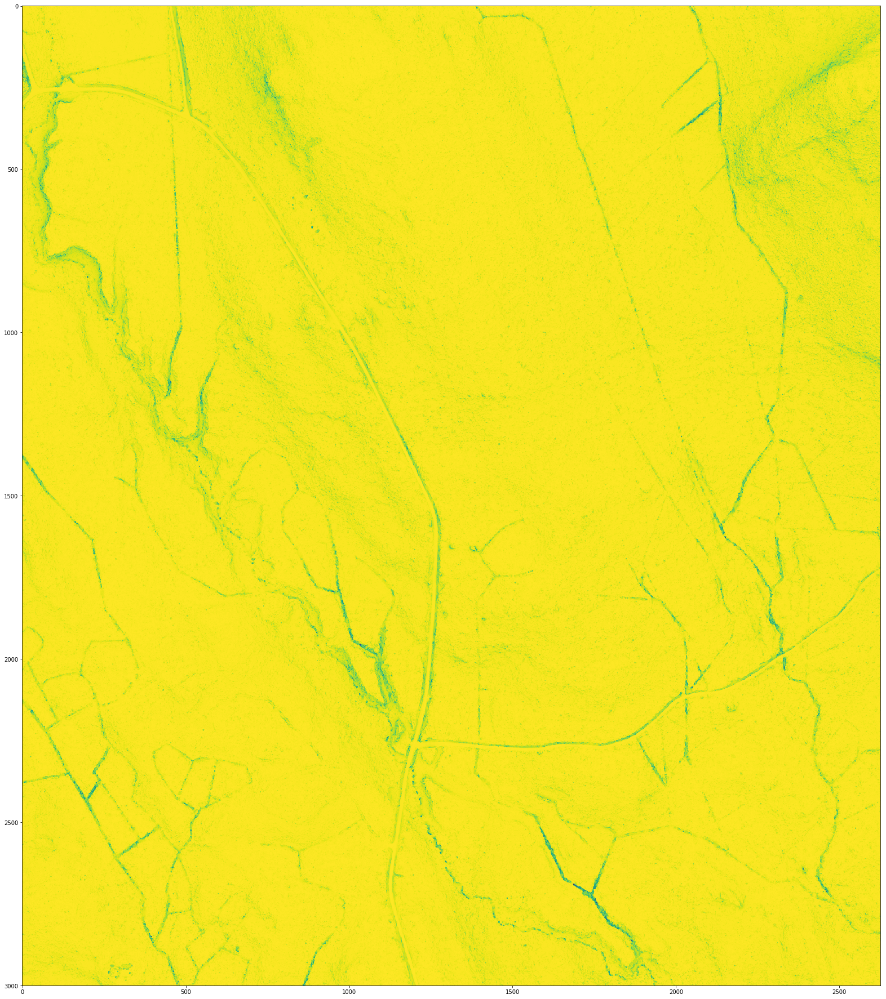

In [113]:
skyview = np.load("Skyview_zone3_raw.npy")
plt.figure(num=None, figsize=(28,32), facecolor='w', edgecolor='k')
#skyview = skyview[2500:,:500]
plt.imshow(skyview)

In [114]:
def gabor_matrix(arr, freq):
    return [
        gabor(image=arr, frequency=freq, n_stds=3)[0],
        gabor(image=arr, frequency=freq, n_stds=3, theta=(30 *  3.14159/180))[0],
        gabor(image=arr, frequency=freq, n_stds=3, theta=(60 *  3.14159/180))[0],
        gabor(image=arr, frequency=freq, n_stds=3, theta=(90 *  3.14159/180))[0],
        gabor(image=arr, frequency=freq, n_stds=3, theta=(120 *  3.14159/180))[0],
        gabor(image=arr, frequency=freq, n_stds=3, theta=(150 *  3.14159/180))[0]
    ]

In [115]:
gabors = np.real(gabor_matrix(skyview, 0.03))

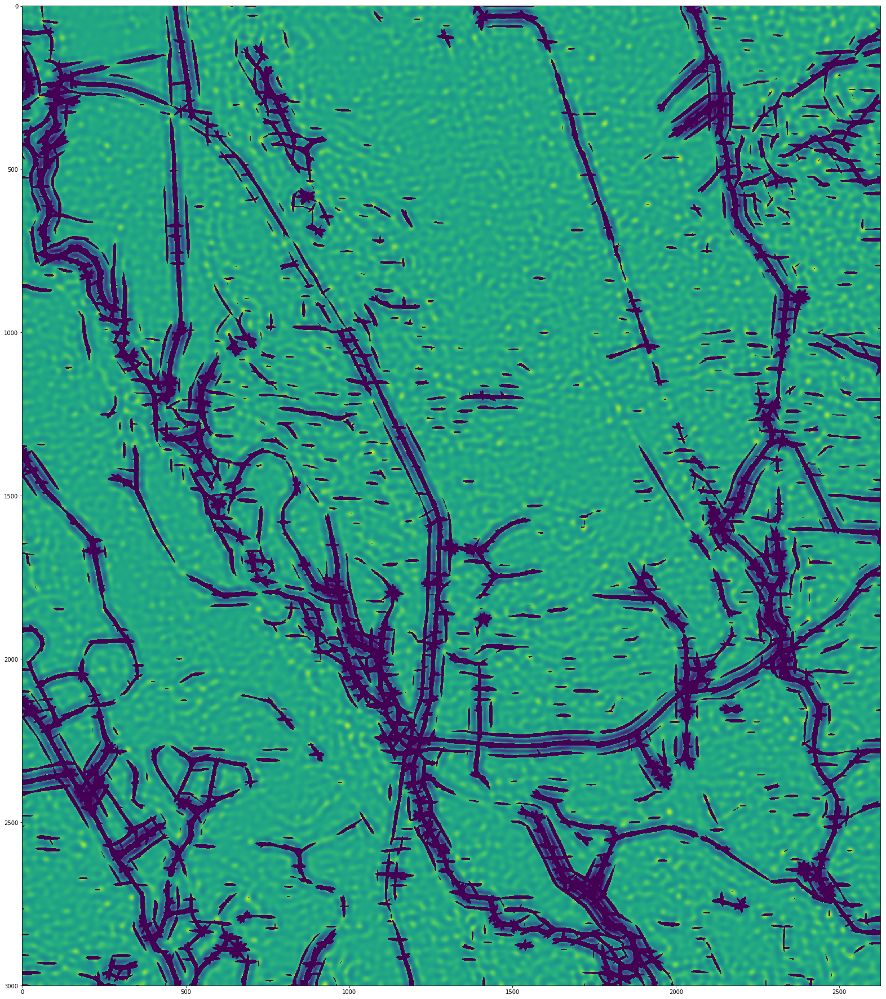

In [121]:
plt.figure(num=None, figsize=(28,32), facecolor='w', edgecolor='k')

def normalize(gab):
    gab = gab - gab.mean() 
    gab = gab / gab.max() 
    gab = 1 - gab
    gab[gab > 1.1] = 0
    return gab
    
gabors_norm = list(map(normalize, gabors))

product = reduce((lambda x, y: x * y), gabors_norm)
plt.imshow(product)

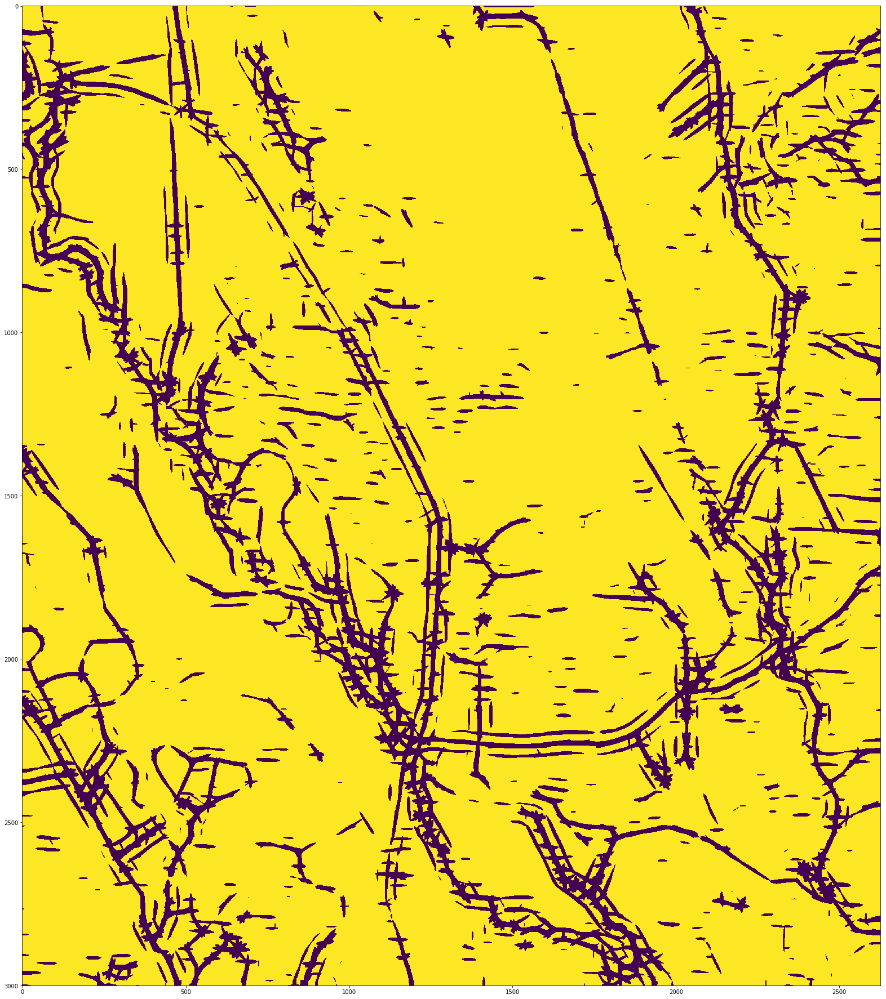

In [122]:
product[product !=0] = 1


plt.figure(num=None, figsize=(28,32), facecolor='w', edgecolor='k')
plt.imshow(product)

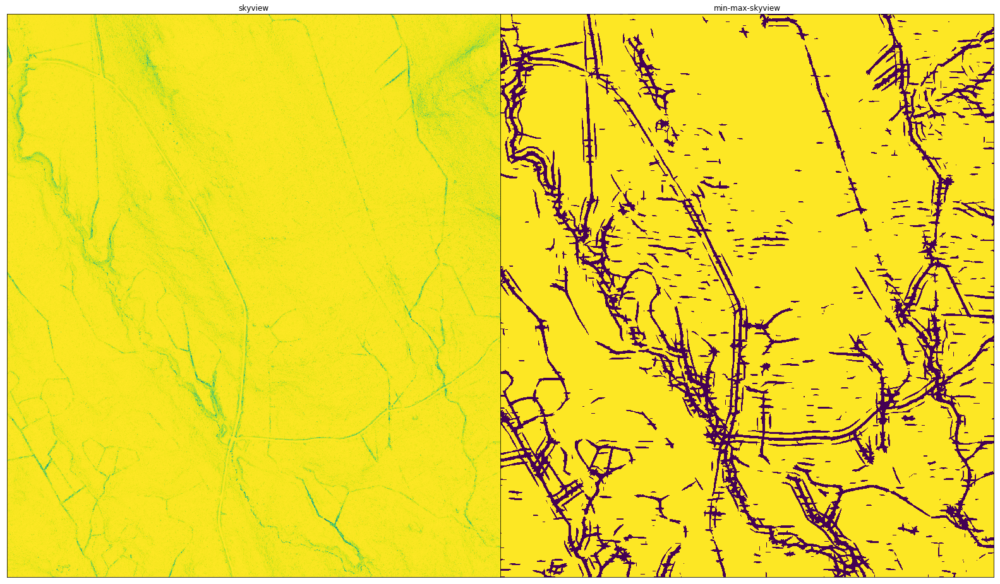

In [123]:
plt.figure(num=None, figsize=(28,32), facecolor='w', edgecolor='k')
ax = [plt.subplot(1,2,i+1) for i in range(2)]
for a in ax:
    a.set_xticklabels([])
    a.set_yticklabels([])
    a.tick_params(bottom=False, left=False)
plt.subplots_adjust(wspace=0,hspace=0.1)


ax[0].title.set_text("skyview")
ax[0].imshow(skyview)
ax[1].title.set_text("min-max-skyview")
ax[1].imshow(product)